In [125]:
import os
import numpy as np
import pandas as pd
import arcgis
import json
import scipy.io
from arcgis.gis import GIS
from arcgis.geometry import Point, MultiPoint
from arcgis.features import GeoAccessor, GeoSeriesAccessor
from pathlib import Path

from examples.efuel.import_sites import import_sites
from hopp.utilities.keys import set_arcgis_key_dot_env
from hopp.tools.resource.resource_tools import get_country

# Set API key using .env file
set_arcgis_key_dot_env()
ARCGIS_API_KEY = os.getenv("ARCGIS_API_KEY")

# Import .mat file from old Matlab scripts
input_path = Path('inputs')
mat_table = pd.read_csv(input_path/'MatTable.txt')
Z = pd.read_csv(input_path/'Z.txt')
# lcom_array = mat_table.loc[:,'LCOE'].values
lcom_array= Z.loc[:,'LCOM'].values
ci_array = mat_table.loc[:,'TrueCI'].values
latitudes = mat_table.loc[:,'Latitude'].values
longitudes = mat_table.loc[:,'Longitude'].values

# Import 2D array of LCOM
lcom_file = 'lcom_geo2.csv'
output_path = Path('outputs')
geodata_fp = input_path/'countries.geojson'
with open(geodata_fp, 'r') as open_file:
    geodata = json.load(open_file)

# Make lists of lats, lons, and data
lat_list = []
lon_list = []
ci_list = []
lcom_list = []
max_lcom = .67
shape_list = []
for k in range(len(lcom_array)):
    # Filter out non-usa points
    country = get_country(latitudes[k], longitudes[k], geodata)
    if (country == 'United States of America') or ((country == 'unknown') and (k<258 or k>260)):
        lat_list.append(latitudes[k])
        lon_list.append(longitudes[k])
        lcom_list.append(lcom_array[k][0])
        ci_list.append(ci_array[k])
        if k % 19 == 0:
            shape_list.append('s')
        else:
            shape_list.append('o')

IndexError: index 1861 is out of bounds for axis 0 with size 1861

In [ ]:
# print(coord_df['lcom'])
print(np.min(coord_df['lcom']))

0.969164253729171


In [ ]:
# Rearrange to 1-D spatial dataframe
coord_df = pd.DataFrame({'lat':lat_list, 'lon':lon_list})
coord_df['lcom'] = lcom_list#[i*12.345+0.4648 for i in lcom_list]
coord_sdf = pd.DataFrame.spatial.from_xy(coord_df,'lon','lat')

coord_df2 = pd.DataFrame({'lat':lat_list, 'lon':lon_list})
coord_df2['ci'] = [i*26.18/28.7023*.05466*.327+0.078 for i in ci_list]
coord_sdf2 = pd.DataFrame.spatial.from_xy(coord_df2,'lon','lat')

# Figure out mercator width and height
lat_min = 25
lat_max = 50
lon_min = -125
lon_max = -67

# Stolen from gis.stackexchange.com/questions/156035
def merc_x(lon):
  r_major=6378137.000
  return r_major*(lon*np.pi/180)
def merc_y(lat):
  if lat>89.5:lat=89.5
  if lat<-89.5:lat=-89.5
  r_major=6378137.000
  r_minor=6356752.3142
  temp=r_minor/r_major
  eccent=(1-temp**2)**.5
  phi=(lat*np.pi/180)
  sinphi=np.sin(phi)
  con=eccent*sinphi
  com=eccent/2
  con=((1.0-con)/(1.0+con))**com
  ts=np.tan((np.pi/2-phi)/2)/con
  y=0-r_major*np.log(ts)
  return y

min_x = merc_x(lon_min)
max_x = merc_x(lon_max)
min_y = merc_y(lat_min)
max_y = merc_y(lat_max)

width = (max_x-min_x)/1000
height = (max_y-min_y)/1000

In [ ]:
# Import display modules and widen notebook
from IPython.display import display, HTML
from ipywidgets import *
display(HTML("<style>.container { width:100% !important; }</style>"))

# Create map and set up display
gis = GIS()
gis = GIS(url='https://jmtjk39zmmjephwj.maps.arcgis.com/',
          username='jmartin4nrel',
          password='WhDiEvBe40?!')
map = gis.map("USA", zoomlevel=5)
map.center = [38.5,-97]
colormap = 'turbo'
dpi = 92
map.layout=Layout(flex='1 1', width='{:d}px'.format(int(width/4)), height='{:d}px'.format(int(height/4)))
map.extent = {'spatialReference':{'wkid':3857},
                                    'xmin':min_x,
                                    'ymin':min_y,
                                    'xmax':max_x,
                                    'ymax':max_y}

# Set up point renderer with color mapping
rend = arcgis.mapping.renderer.generate_classbreaks(coord_sdf,
                                                    'Point',
                                                    colors=colormap,
                                                    field='lcom',
                                                    class_count=255, 
                                                    marker_size=5,
                                                    line_width=1,
                                                    outline_color=[0,0,0,255],
                                                    shape_list=shape_list)
max_vals = [np.min(coord_sdf['lcom'].values)]
max_vals.extend([i['classMaxValue'] for i in rend['classBreakInfos']])
colors = [i['symbol']['color'] for i in rend['classBreakInfos']]

# Plot the colored points
coord_sdf.spatial.plot(map,renderer=rend)
# map
map.save({'title':'LCOM',
        'snippet':'Map created using Python API showing levelized cost of methanol',
        'tags':[],
        'extent':{'spatialReference':{'wkid':3857},
                        'xmin':min_x,
                        'ymin':min_y,
                        'xmax':max_x,
                        'ymax':max_y}})

# Set up point renderer with color mapping
rend2 = arcgis.mapping.renderer.generate_classbreaks(coord_sdf2,
                                                    'Point',
                                                    colors=colormap,
                                                    field='ci',
                                                    class_count=255, 
                                                    marker_size=5,
                                                    line_width=1,
                                                    outline_color=[0,0,0,255],
                                                    shape_list=shape_list)
max_vals2 = [np.min(coord_sdf2['ci'].values)]
max_vals2.extend([i['classMaxValue'] for i in rend2['classBreakInfos']])
colors2 = [i['symbol']['color'] for i in rend2['classBreakInfos']]

# Plot the colored points
coord_sdf2.spatial.plot(map,renderer=rend2)
# map
map.save({'title':'CI',
        'snippet':'Map created using Python API showing carbon intensity',
        'tags':[],
        'extent':{'spatialReference':{'wkid':3857},
                        'xmin':min_x,
                        'ymin':min_y,
                        'xmax':max_x,
                        'ymax':max_y}})

HTML(value='<style>.container { width:100% !important; }</style>')

<Item title:"CI" type:Web Map owner:jmartin4nrel>

In [ ]:
fn = 'web_map.png'
map_url = map.webmap.print('PNG32',dpi=dpi*4,
                           extent={'spatialReference':{'wkid':3857},
                                'xmin':min_x,
                                'ymin':min_y,
                                'xmax':max_x,
                                'ymax':max_y},
                            output_dimensions=(width,height))
import requests
with requests.get(map_url) as resp:
    with open(output_path/fn, 'wb') as file_handle:
        file_handle.write(resp.content)

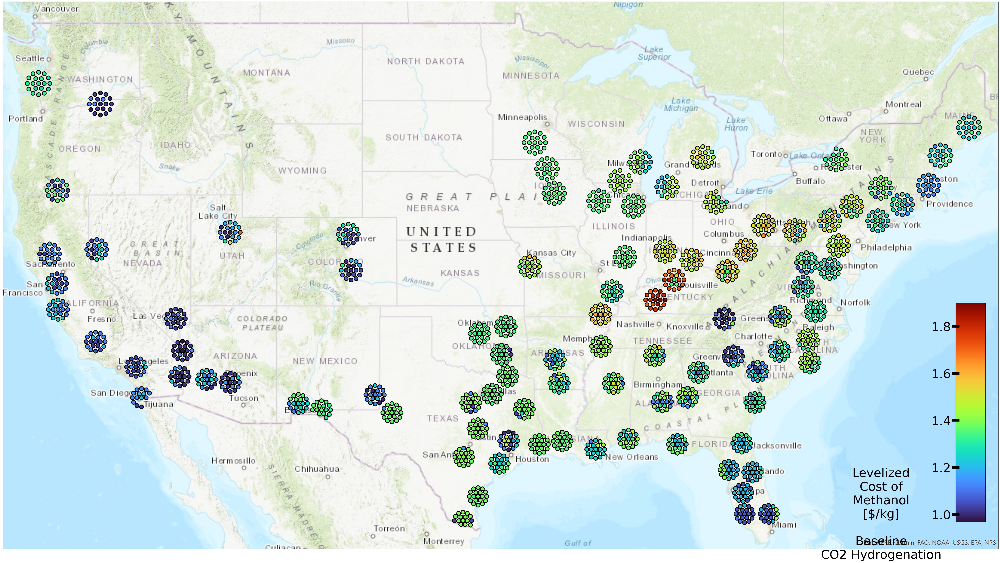

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig = plt.gcf()
fig.set_figwidth(width/dpi)
fig.set_figheight(height/dpi)

im = plt.imshow(np.reshape(max_vals,(16,16)), cmap='turbo')
image = plt.imread(output_path/fn)
plt.imshow(image, extent=[0, width, 0, height])
plt.xticks([])
plt.yticks([])
plt.rcParams['font.size'] = 48
plt.rcParams['xtick.major.size'] = 10

ax = plt.gca()
bbox = ax.bbox.bounds
cbaxes = inset_axes(ax, width="3%", height="80%", loc=7, bbox_to_anchor=(bbox[0],bbox[1],bbox[2]*.99,bbox[3]*.5)) 
cbar = plt.colorbar(im, cax=cbaxes, ticklocation='left')
cbaxes.tick_params(direction='inout', length=30, width=10)
plt.text(-2.5,1,'Levelized\nCost of\nMethanol\n[$/kg]\n\nBaseline\nCO2 Hydrogenation',horizontalalignment='center',verticalalignment='center')


plt.show()